In [1]:
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
plt.rcParams['font.sans-serif']=['SimHei'] #用来正常显示中文标签, 有中文出现的情况，需要u'内容'
plt.rcParams['axes.unicode_minus']=False #用来正常显示负号
import matplotlib as mpl
mpl.rcParams.update({'font.size': 16})

import numpy as np
import tensorflow as tf

## 查看图片


**图一般用0.0-1.0的浮点数表示，或者0-255的整数表示。**

In [2]:
from PIL import Image

In [3]:
hb = Image.open('./hb.jpg')

In [4]:
hb.format,hb.size,hb.mode

('JPEG', (3840, 2160), 'RGB')

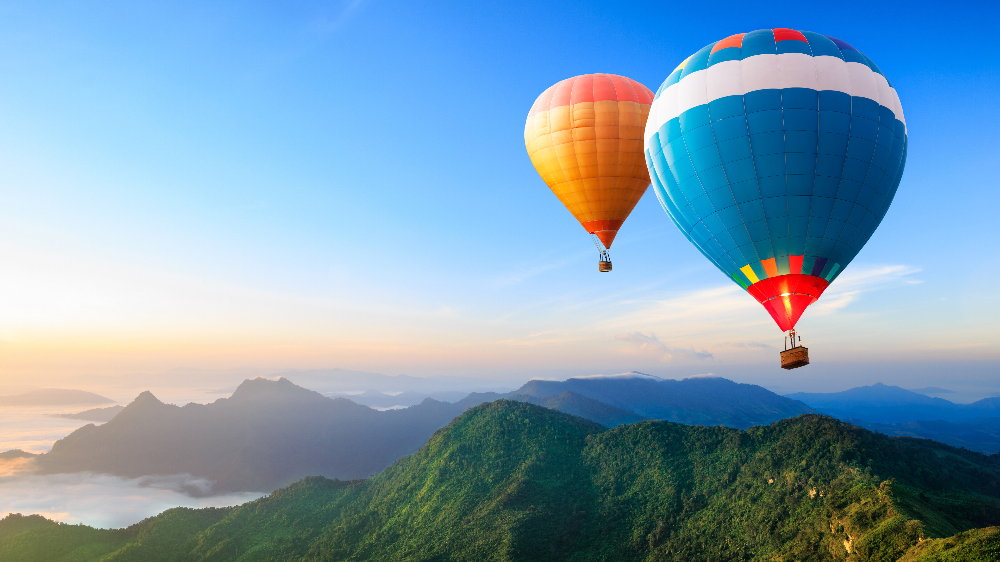

In [5]:
hb

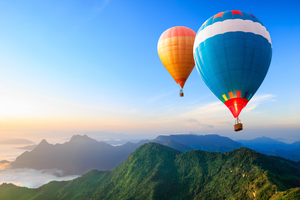

In [6]:
# 改变大小
hb = hb.resize((300,200),Image.ANTIALIAS)  # hb.resize((width,height))
hb

In [7]:
# 转换数据类型
image = np.array(hb)
image = image.astype(np.float32)
image.shape

(200, 300, 3)

查看3个颜色通道

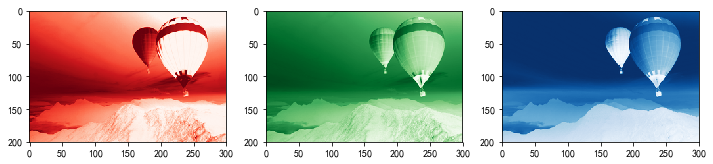

In [8]:
plt.figure(figsize=(12,4))
plt.subplot(131)
plt.imshow(image[:,:,0].astype(np.uint8),cmap='Reds')
plt.subplot(132)
plt.imshow(image[:,:,1].astype(np.uint8),cmap='Greens')
plt.subplot(133)
plt.imshow(image[:,:,2].astype(np.uint8),cmap='Blues')

转化为灰度图  
参考 https://stackoverflow.com/questions/12201577/how-can-i-convert-an-rgb-image-into-grayscale-in-python

In [9]:
def rgb2gray(imrgb):
    rgb = np.dot(imrgb,[0.299, 0.587 ,0.144])
    return np.clip(rgb,0,255)
image_gray = rgb2gray(image)

定义原图和模糊图的画图函数

In [10]:
def plotimage(true,blur,color='rgb'):
    fig,ax = plt.subplots(1,2,figsize=(10,5))
    if color=='gray':
        ax[0].imshow(true,cmap=color)
        ax[1].imshow(blur,cmap=color)
    else:
        ax[0].imshow(true)
        ax[1].imshow(blur)
        
    ax[0].set_title(u'原图')
    ax[1].set_title(u'高斯模糊图')

## 高斯模糊

计算高斯核

In [11]:
def gaussian_kernel(size=5,sigma=2):
    '''
    size: int,一般取为奇数
    sigma: blur factor
    
    return: (normalized) Gaussian kernel
    '''
    x_points = np.arange(-(size-1)//2,(size-1)//2+1,1)
    y_points = x_points[::-1]
    xs,ys = np.meshgrid(x_points,y_points)
    kernel = np.exp(-(xs**2+ys**2)/(2*sigma**2))/(2*np.pi*sigma**2)
    return kernel/kernel.sum()


可视化高斯核

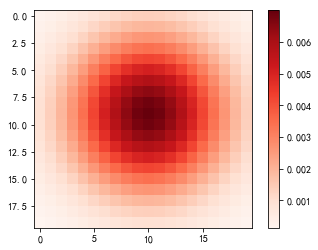

In [12]:
plt.imshow(gaussian_kernel(20,5),cmap='Reds')
plt.colorbar()

## tensorflow
### 灰度图高斯模糊

In [13]:
kernel = gaussian_kernel(size=10,sigma=5)
kernel = kernel[:, :, np.newaxis, np.newaxis] # height,width, channel_in, channel_out

In [14]:
x = tf.placeholder(tf.float32,shape=(None,200,300,1))    # (batch_size, height, width, channel)
x_blur = tf.nn.conv2d(x, kernel, strides=[1, 1, 1, 1], padding='SAME')

In [15]:
s = tf.InteractiveSession()
image_batch = image_gray[np.newaxis,:,:,np.newaxis]  # (batch_size, height, width, channel)
blur_imgs = s.run(x_blur,feed_dict={x:image_batch})
s.close()

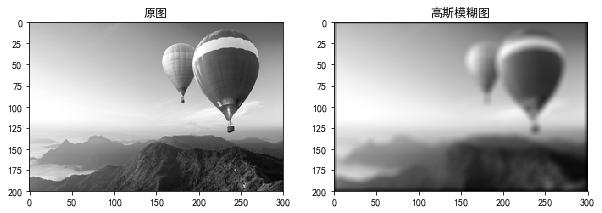

In [16]:
plotimage(image_gray,blur_imgs[0,:,:,0],color='gray')

### 彩色图高斯模糊

In [17]:
kernel = gaussian_kernel(size=10,sigma=5)
kernel = kernel[:, :, np.newaxis, np.newaxis] # height,width, channel_in, channel_out

对不同的通道做卷积，然后拼起来

In [18]:
x = tf.placeholder(tf.float32,shape=(None,200,300,3))    # (batch_size, height, width, channel)
xr,xg,xb =tf.expand_dims(x[:,:,:,0],-1),tf.expand_dims(x[:,:,:,1],-1),tf.expand_dims(x[:,:,:,2],-1)

xr_blur = tf.nn.conv2d(xr, kernel, strides=[1, 1, 1, 1], padding='SAME')
xg_blur = tf.nn.conv2d(xg, kernel, strides=[1, 1, 1, 1], padding='SAME')
xb_blur = tf.nn.conv2d(xb, kernel, strides=[1, 1, 1, 1], padding='SAME')
xrgb_blur = tf.concat([xr_blur,xg_blur,xb_blur],axis=3)

In [19]:
s = tf.InteractiveSession()
image_batch = image[np.newaxis,:,:,:]
blur_imgs = s.run(xrgb_blur,feed_dict={x:image_batch})
s.close()

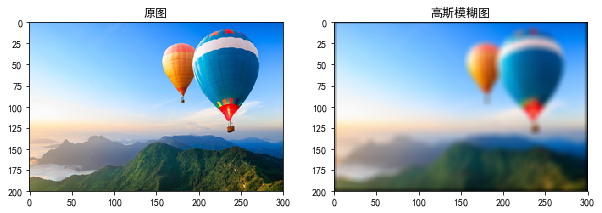

In [20]:
plotimage(image.astype(np.uint8),blur_imgs[0].astype(np.uint8))

查看模糊图的3个颜色通道

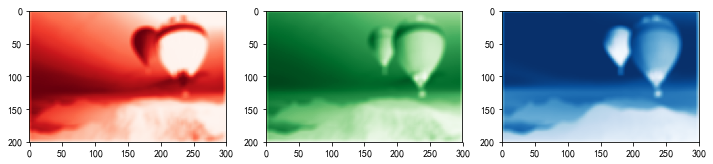

In [21]:
plt.figure(figsize=(12,4))
plt.subplot(131)
plt.imshow(blur_imgs[0][:,:,0].astype(np.uint8),cmap='Reds')
plt.subplot(132)
plt.imshow(blur_imgs[0][:,:,1].astype(np.uint8),cmap='Greens')
plt.subplot(133)
plt.imshow(blur_imgs[0][:,:,2].astype(np.uint8),cmap='Blues')

## cv2
https://docs.opencv.org/3.1.0/d4/d13/tutorial_py_filtering.html

In [22]:
import cv2 as cv

In [23]:
size = 5
sigma = 5
blur = cv.GaussianBlur(image,(size,size),sigma)

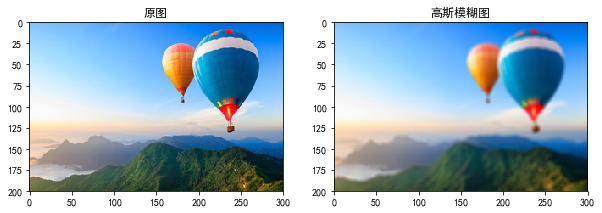

In [24]:
plotimage(image.astype(np.uint8),blur.astype(np.uint8))

### scipy
https://docs.scipy.org/doc/scipy/reference/generated/scipy.ndimage.gaussian_filter.html#scipy.ndimage.gaussian_filter

In [25]:
from scipy.ndimage import filters

filters.gaussian_filter不能指定窗口的大小  
需要根据根据窗口大小size和sigma的大小，计算trucate参数。具体见：  
https://stackoverflow.com/questions/25216382/gaussian-filter-in-scipy

In [26]:
def gaussian_blur(image, sigma=2, size = 3):
    '''
    image: [h,w,c]
    size: 高斯核大小
    sigma：模糊因子
    '''
    # compute the truncate using size
    t = (((size - 1)/2)-0.5)/sigma
    im = np.zeros_like(image)
    channels = image.shape[-1]
    for i in range(channels):
        im[:, :, i] = filters.gaussian_filter(image[:, :, i], sigma,truncate=t)
    return im

In [27]:
blur = gaussian_blur(image,sigma=5,size=5)

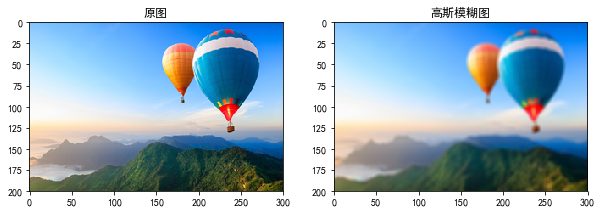

In [28]:
plotimage(image.astype(np.uint8),blur.astype(np.uint8))